## Задание 1: Стандартные аугментации torchvision (15 баллов)

1. Создайте пайплайн стандартных аугментаций torchvision (например, RandomHorizontalFlip, RandomCrop, ColorJitter, RandomRotation, RandomGrayscale).
2. Примените аугментации к 5 изображениям из разных классов (папка train).
3. Визуализируйте:
   - Оригинал
   - Результат применения каждой аугментации отдельно
   - Результат применения всех аугментаций вместе


Обработка изображения класса: Гароу


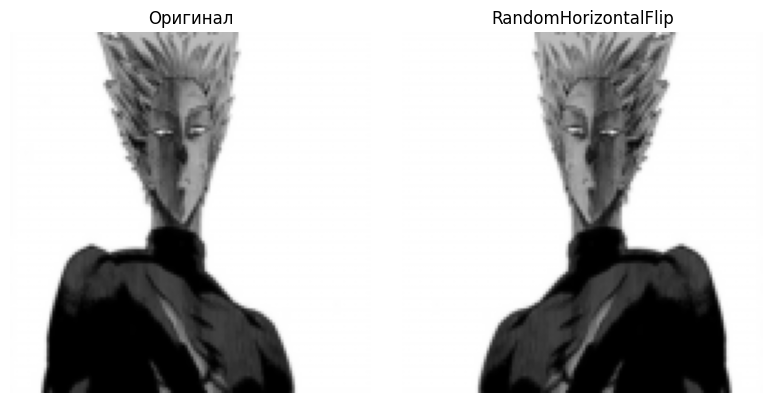

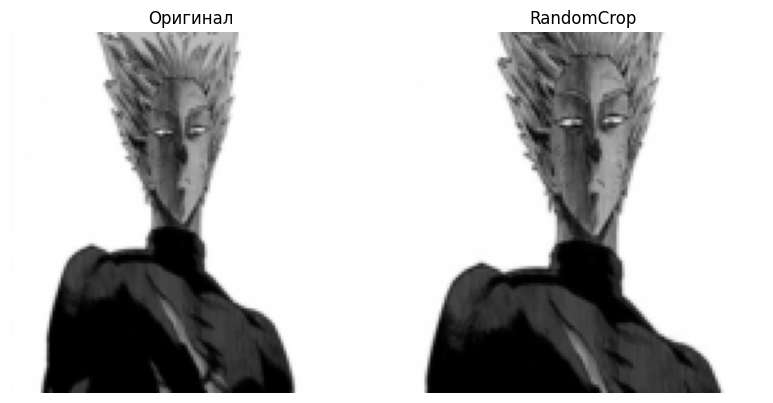

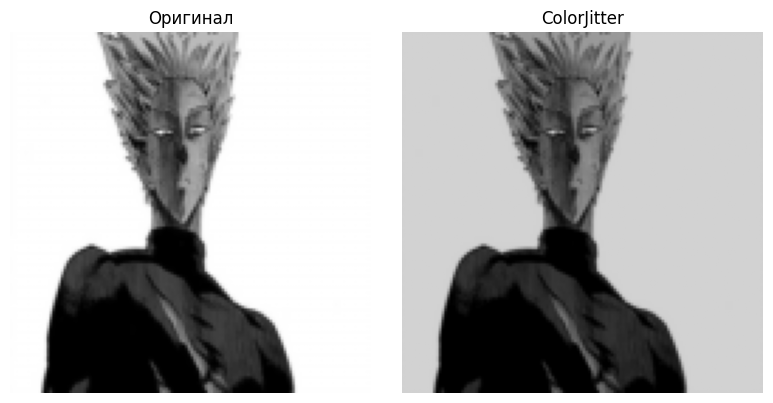

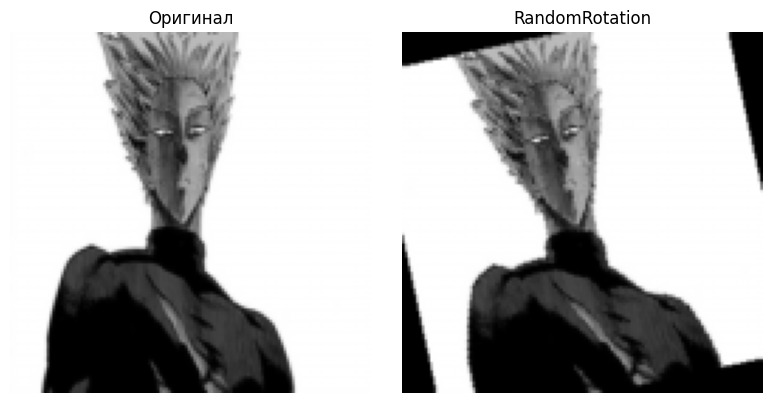

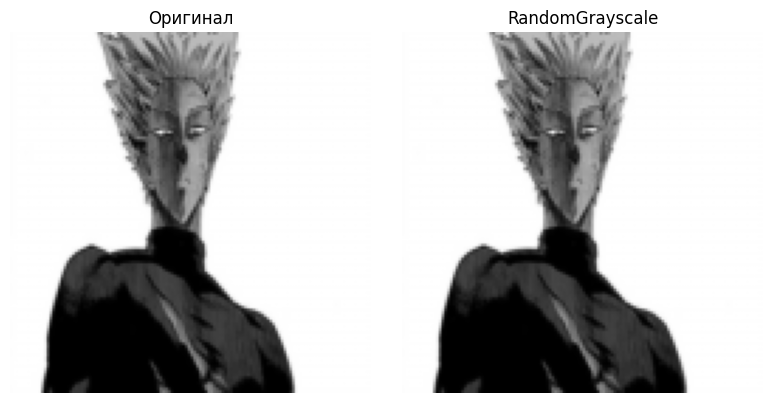

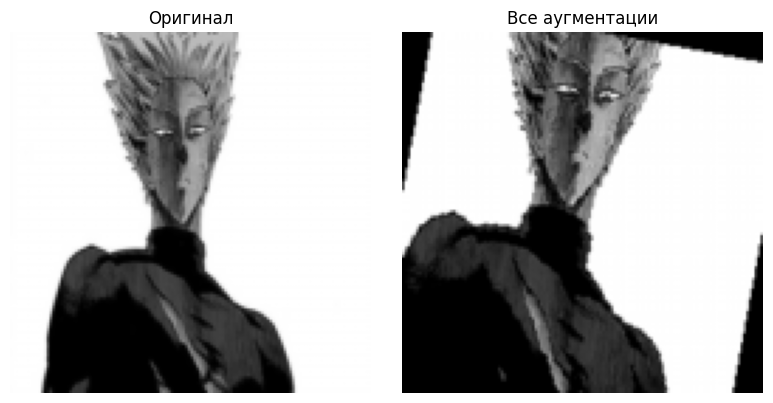

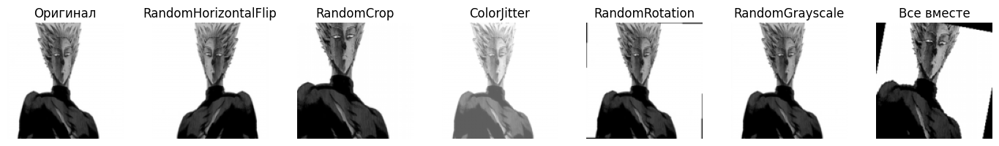


Обработка изображения класса: Генос


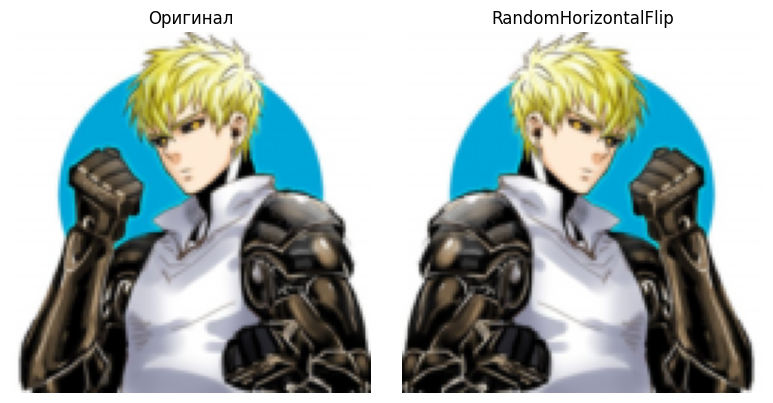

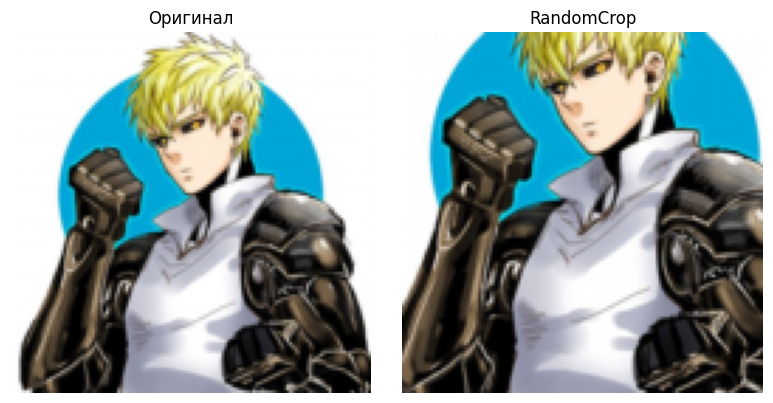

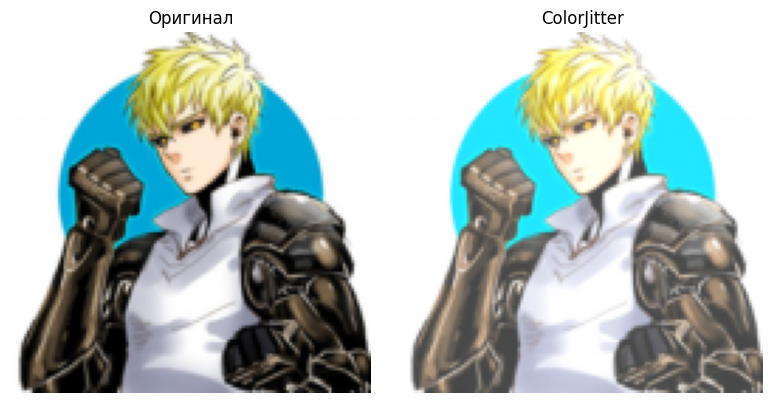

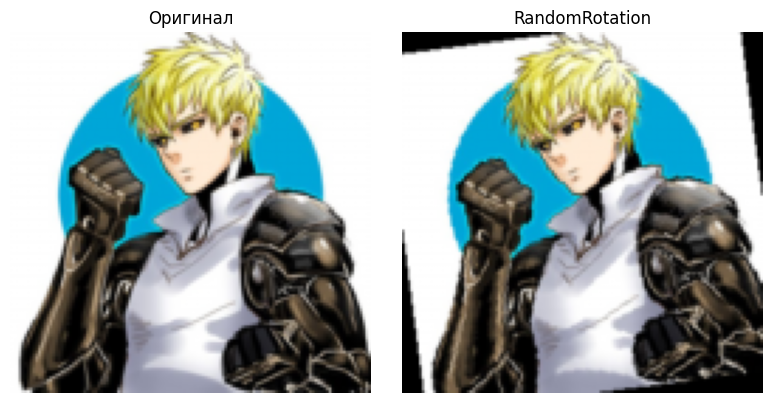

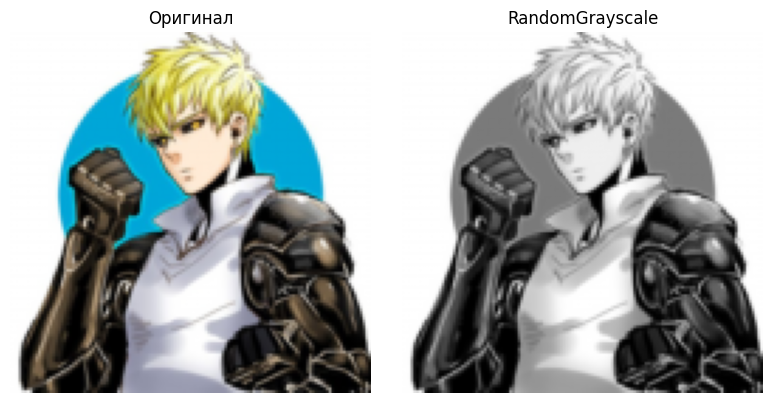

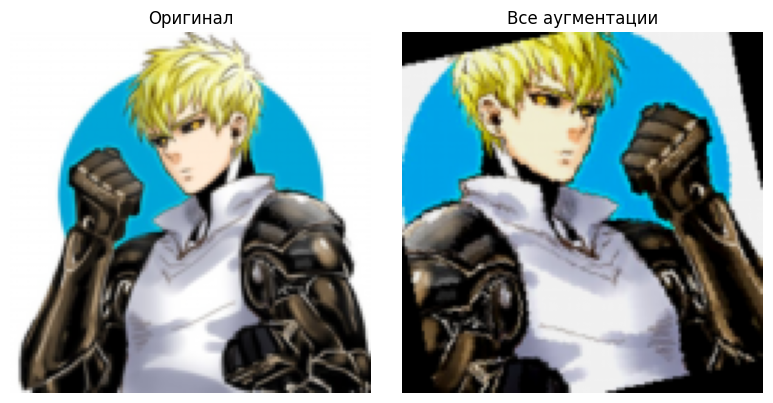

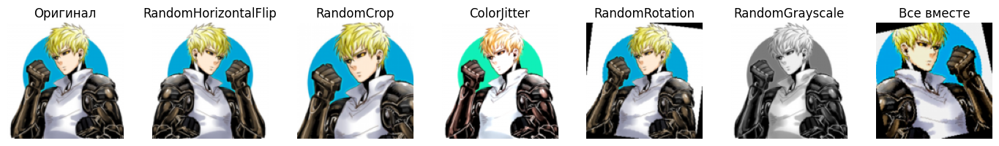


Обработка изображения класса: Сайтама


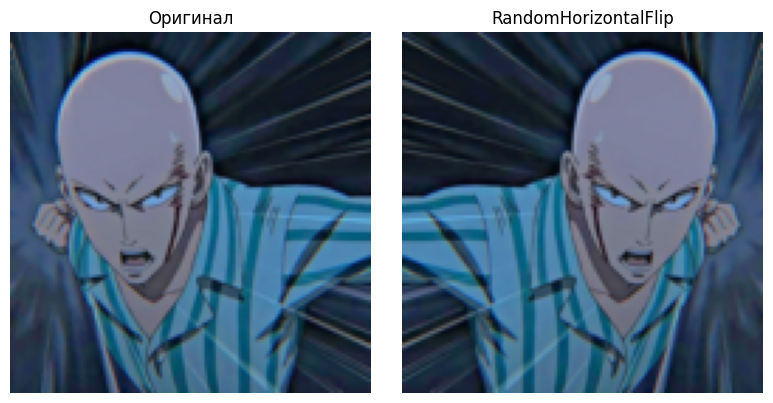

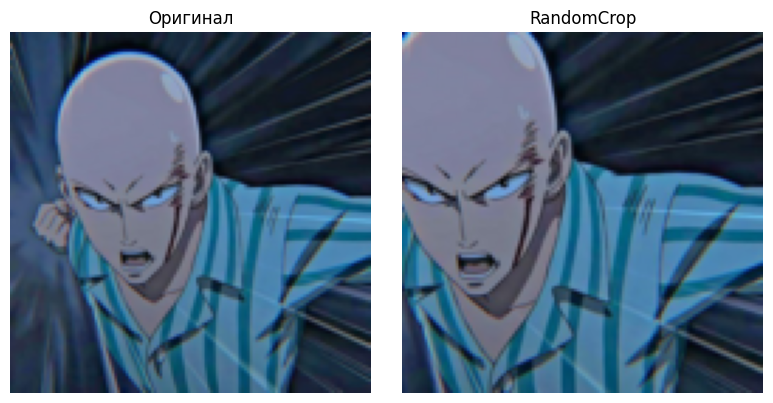

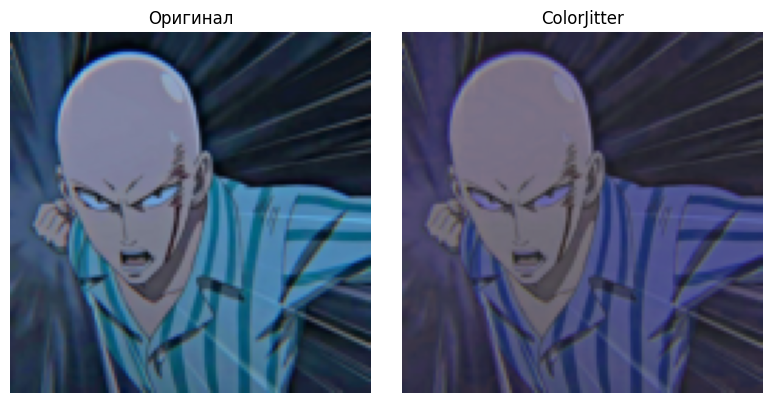

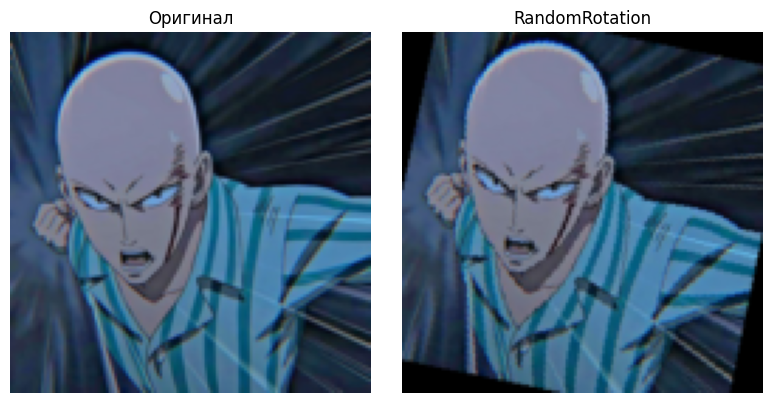

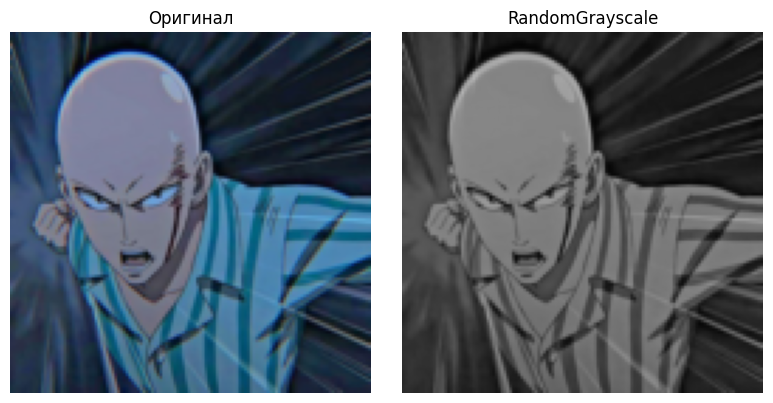

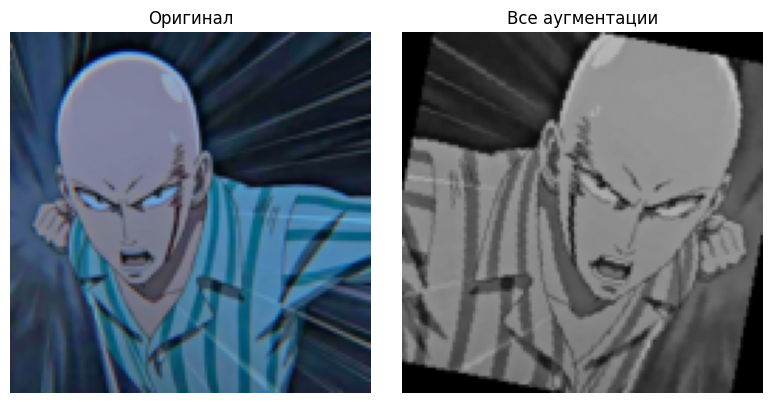

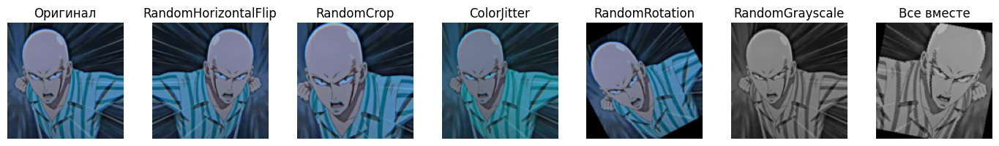


Обработка изображения класса: Соник


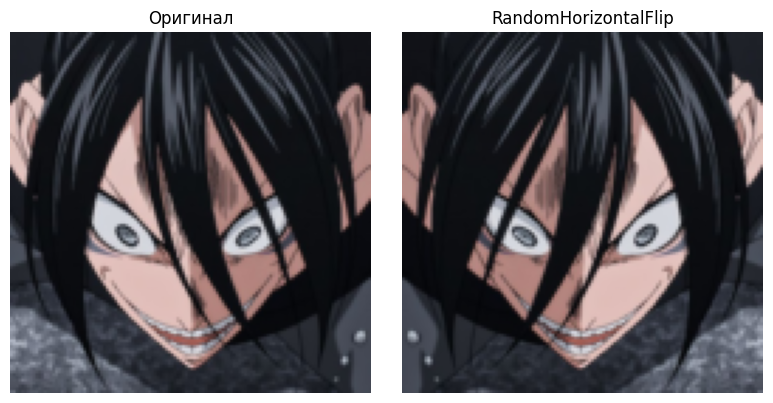

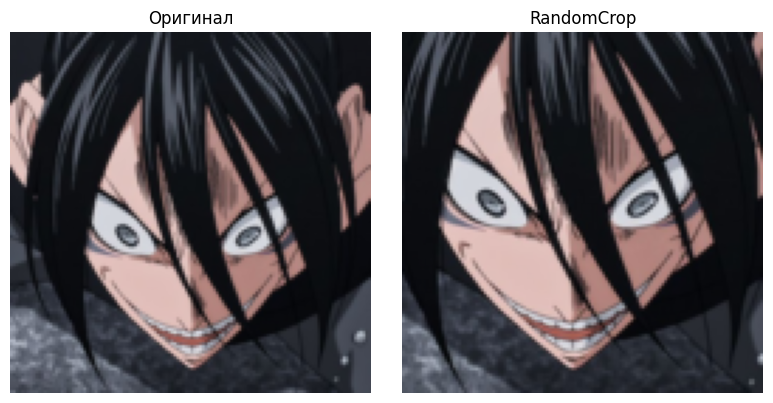

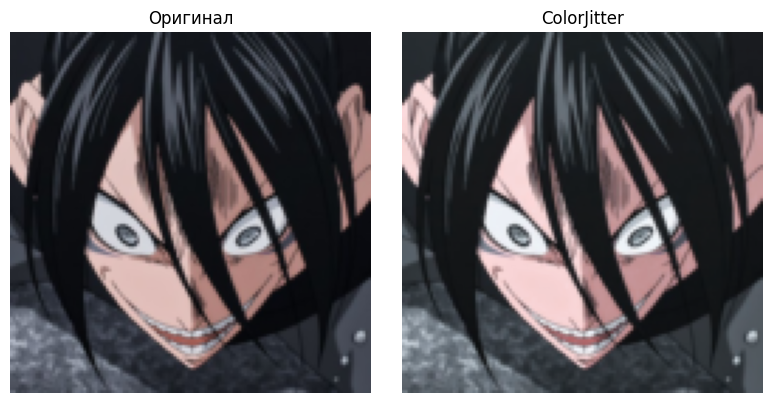

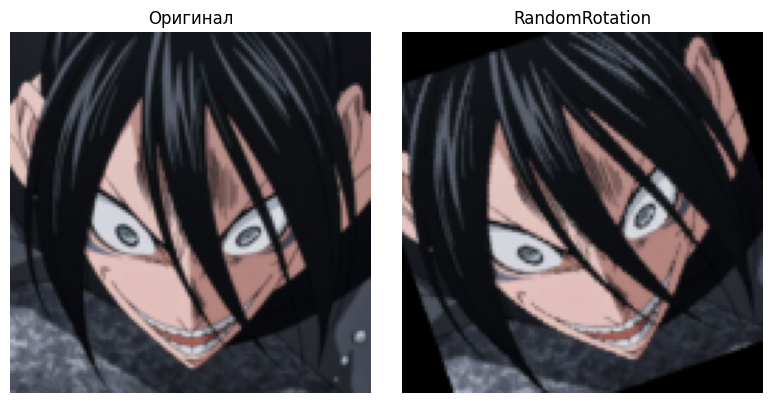

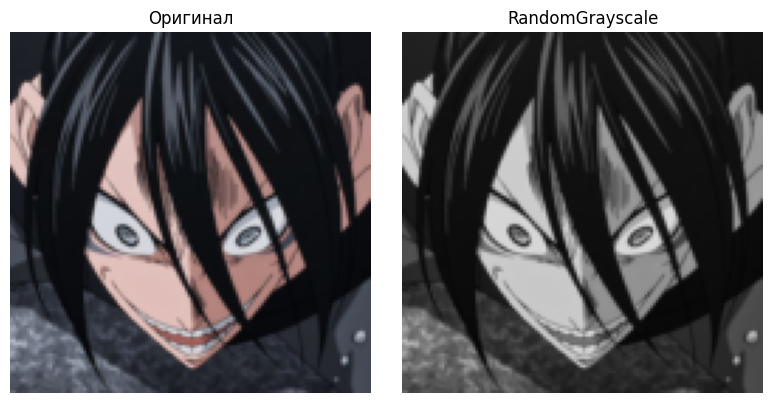

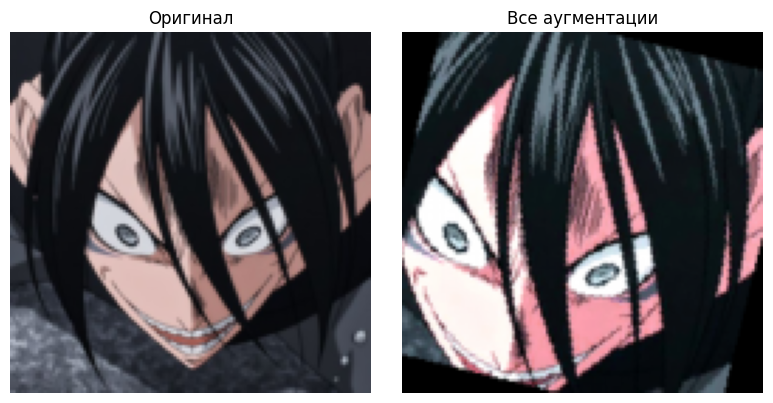

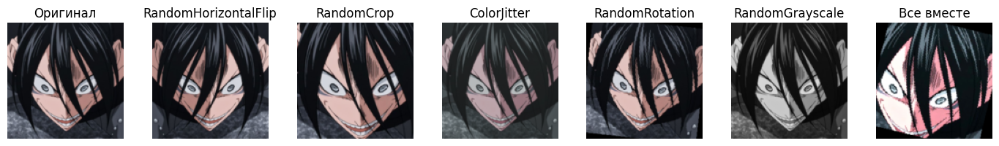


Обработка изображения класса: Татсумаки


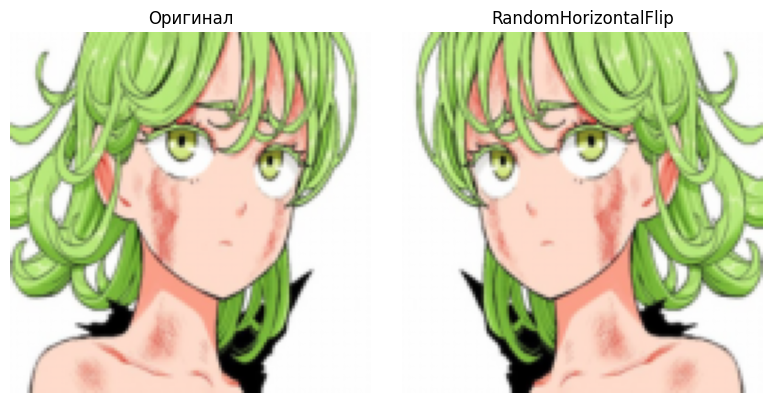

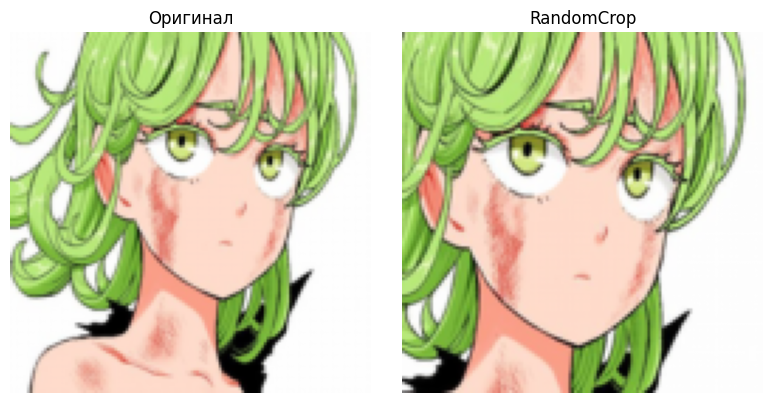

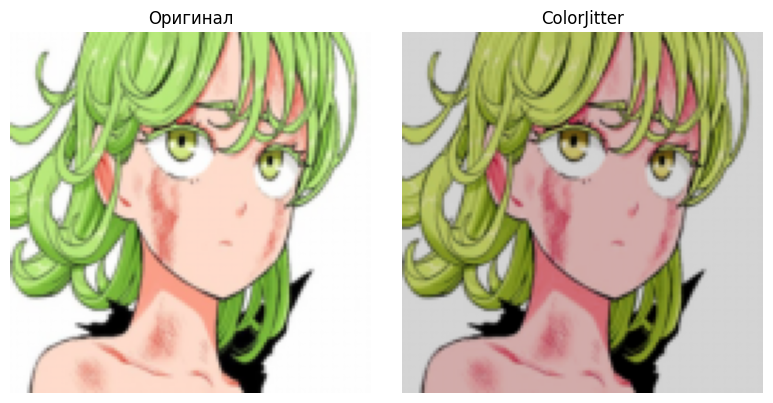

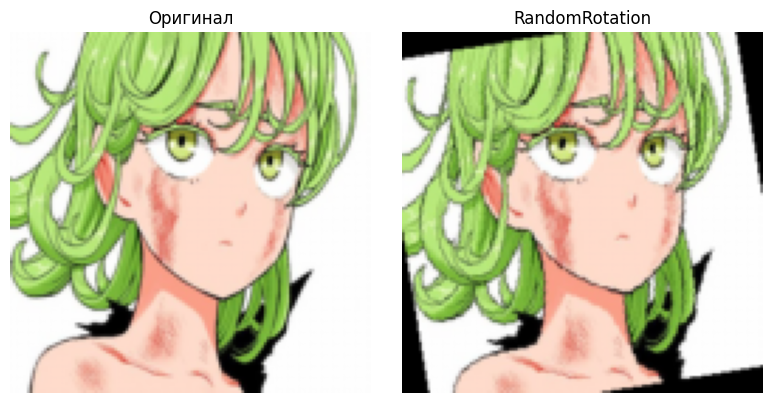

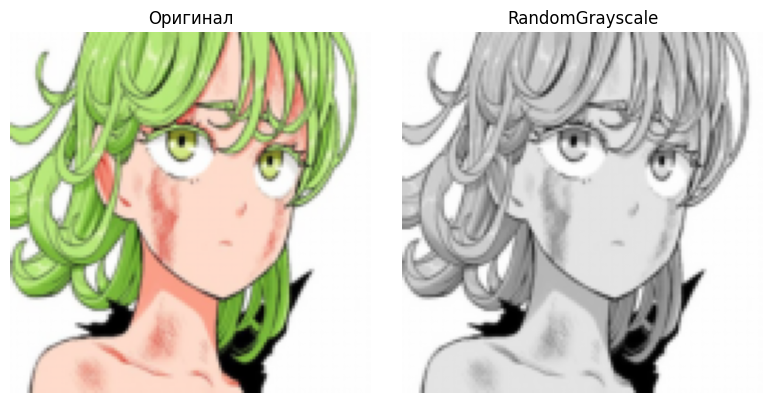

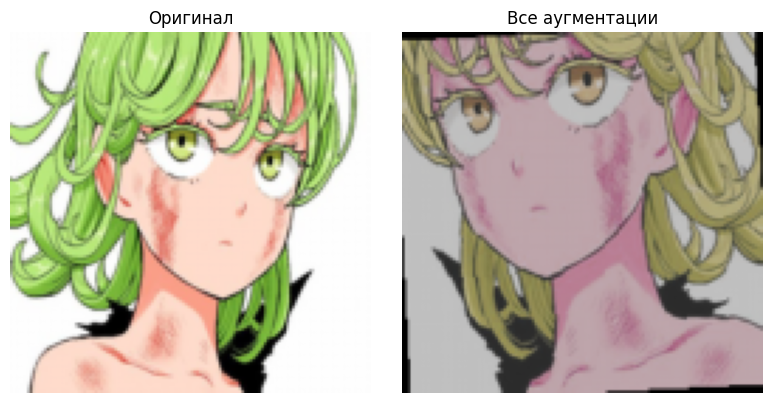

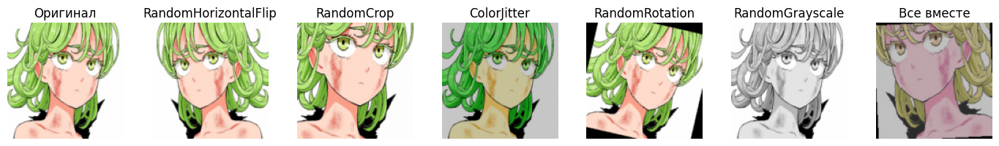


Обработка изображения класса: Фубуки


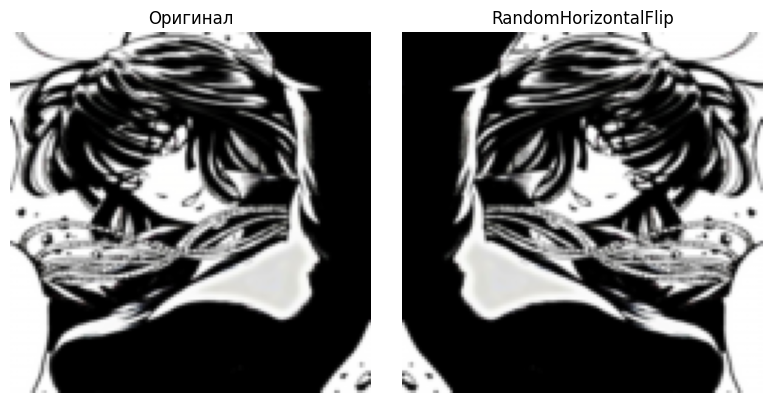

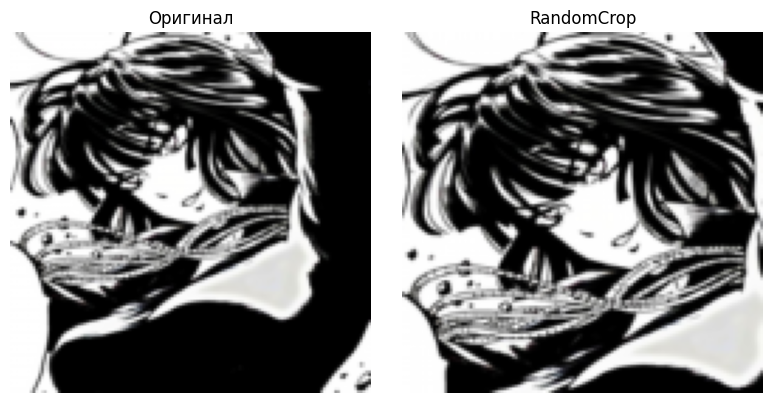

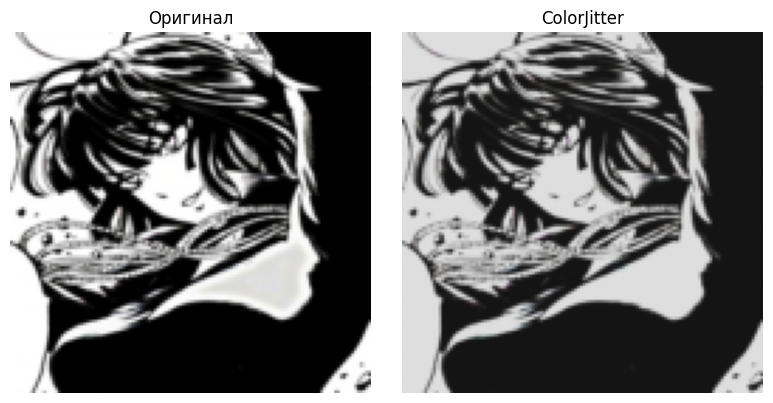

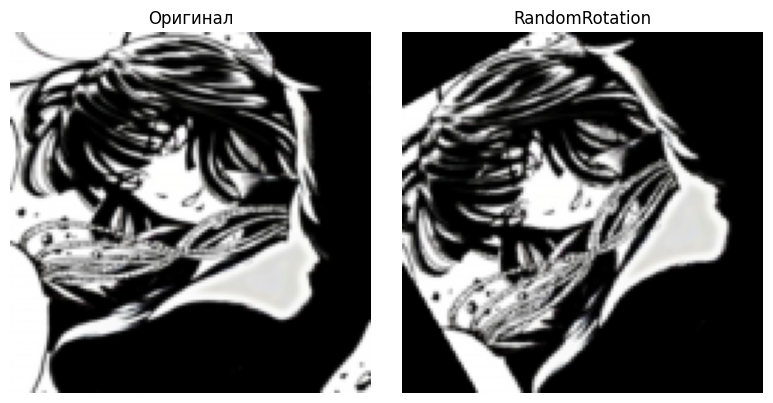

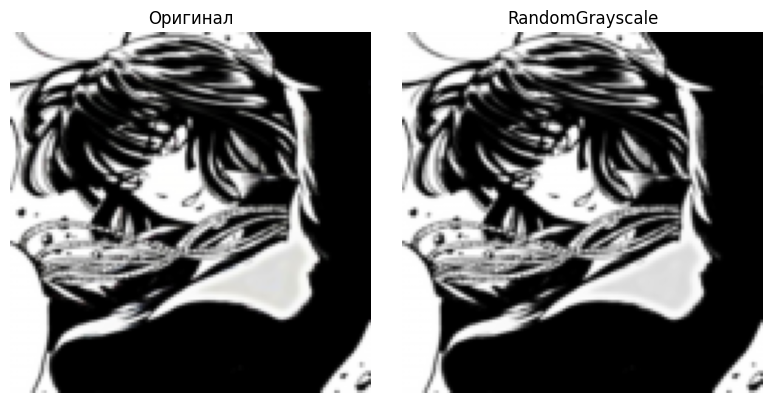

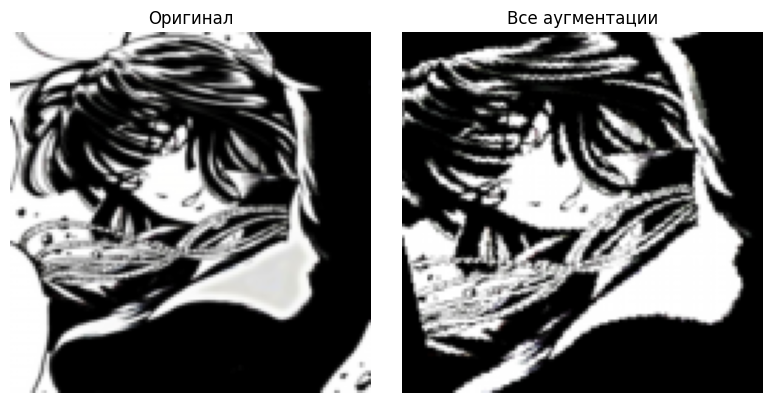

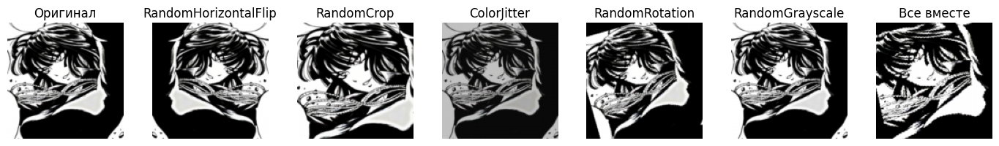

In [10]:
import os
import torch
import torchvision.transforms as transforms
from augmentations_basics.datasets import CustomImageDataset
from augmentations_basics.utils import show_single_augmentation, show_multiple_augmentations
from PIL import Image

# Путь к данным
data_path = "data/train"  # Укажите путь к вашей папке с данными

# Создаем датасет без аугментаций (только ресайз)
dataset = CustomImageDataset(
    root_dir=data_path,
    transform=None,
    target_size=(224, 224)
)

# Собираем по одному изображению из 5 разных классов
class_images = {}
for idx in range(len(dataset)):
    img, label = dataset[idx]
    if label not in class_images:
        class_name = dataset.classes[label]
        class_images[label] = (img, class_name)

# Определяем стандартные аугментации
augmentations = {
    "RandomHorizontalFlip": transforms.RandomHorizontalFlip(p=1.0),
    "RandomCrop": transforms.RandomCrop(180),
    "ColorJitter": transforms.ColorJitter(
        brightness=0.4, contrast=0.4, saturation=0.4, hue=0.1
    ),
    "RandomRotation": transforms.RandomRotation(30),
    "RandomGrayscale": transforms.RandomGrayscale(p=1.0),
}

# Композиция всех аугментаций
all_augmentations = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomCrop(180),
    transforms.ColorJitter(
        brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1
    ),
    transforms.RandomRotation(20),
    transforms.RandomGrayscale(p=0.3),
    transforms.ToTensor()
])

# Для каждого изображения применяем и визуализируем аугментации
for label, (img, class_name) in class_images.items():
    print(f"\nОбработка изображения класса: {class_name}")
    
    # Преобразуем оригинал в тензор для визуализации
    to_tensor = transforms.ToTensor()
    img_tensor = to_tensor(img)
    
    # Показываем оригинал
    # show_single_augmentation(img_tensor, img_tensor, "Оригинал")
    
    # Применяем и показываем каждую аугментацию отдельно
    for aug_name, augmentation in augmentations.items():
        # Создаем преобразование: аугментация + ToTensor
        transform = transforms.Compose([
            augmentation,
            transforms.ToTensor()
        ])
        
        # Применяем аугментацию
        augmented_img = transform(img)
        
        # Визуализируем
        show_single_augmentation(img_tensor, augmented_img, aug_name)
    
    # Применяем все аугментации вместе
    all_augmented = all_augmentations(img)
    show_single_augmentation(img_tensor, all_augmented, "Все аугментации")
    
    # Создаем список всех отдельных аугментаций + композиция
    all_aug_list = []
    titles = []
    
    for aug_name in augmentations:
        transform = transforms.Compose([
            augmentations[aug_name],
            transforms.ToTensor()
        ])
        all_aug_list.append(transform(img))
        titles.append(aug_name)
    
    all_aug_list.append(all_augmented)
    titles.append("Все вместе")
    
    # Показываем все варианты вместе
    show_multiple_augmentations(img_tensor, all_aug_list, titles)

## Задание 2: Кастомные аугментации (20 баллов)

1. Реализуйте минимум 3 кастомные аугментации (например, случайное размытие, случайная перспектива, случайная яркость/контрастность).
2. Примените их к изображениям из train.
3. Сравните визуально с готовыми аугментациями из extra_augs.py.

In [1]:
import random
from PIL import Image, ImageEnhance
import cv2
import numpy as np


class RandomBlur:
    """Случайное размытие изображения"""
    def __init__(self, p=0.5, kernel_size=5):
        self.p = p
        self.kernel_size = kernel_size
    
    def __call__(self, img):
        if random.random() < self.p:
            # Конвертируем тензор в numpy
            img_np = img.numpy().transpose(1, 2, 0)
            # Применяем размытие
            blurred = cv2.GaussianBlur(img_np, (self.kernel_size, self.kernel_size), 0)
            return torch.from_numpy(blurred.transpose(2, 0, 1))
        return img

class RandomPerspective:
    """Случайная перспективная трансформация"""
    def __init__(self, p=0.5, distortion_scale=0.5):
        self.p = p
        self.distortion_scale = distortion_scale
    
    def __call__(self, img):
        if random.random() < self.p:
            # Конвертируем тензор в PIL
            to_pil = transforms.ToPILImage()
            img_pil = to_pil(img)
            
            # Параметры перспективы
            w, h = img_pil.size
            half_w = w // 2
            half_h = h // 2
            
            # Генерируем случайные смещения
            dx = random.randint(0, int(self.distortion_scale * half_w))
            dy = random.randint(0, int(self.distortion_scale * half_h))
            
            # Точки для перспективной трансформации
            src_points = np.float32([[0, 0], [w, 0], [0, h], [w, h]])
            dst_points = np.float32([
                [dx, dy], 
                [w - dx, dy], 
                [0, h], 
                [w, h]
            ])
            
            # Применяем перспективную трансформацию
            M = cv2.getPerspectiveTransform(src_points, dst_points)
            img_np = np.array(img_pil)
            transformed = cv2.warpPerspective(img_np, M, (w, h))
            
            return transforms.ToTensor()(transformed)
        return img

class RandomBrightnessContrast:
    """Случайное изменение яркости и контрастности"""
    def __init__(self, p=0.5, brightness_range=(0.7, 1.3), contrast_range=(0.7, 1.3)):
        self.p = p
        self.brightness_range = brightness_range
        self.contrast_range = contrast_range
    
    def __call__(self, img):
        if random.random() < self.p:
            # Конвертируем тензор в PIL
            to_pil = transforms.ToPILImage()
            img_pil = to_pil(img)
            
            # Изменяем яркость
            brightness_factor = random.uniform(*self.brightness_range)
            enhancer = ImageEnhance.Brightness(img_pil)
            img_pil = enhancer.enhance(brightness_factor)
            
            # Изменяем контраст
            contrast_factor = random.uniform(*self.contrast_range)
            enhancer = ImageEnhance.Contrast(img_pil)
            img_pil = enhancer.enhance(contrast_factor)
            
            return transforms.ToTensor()(img_pil)
        return img


Обработка изображения класса: Гароу


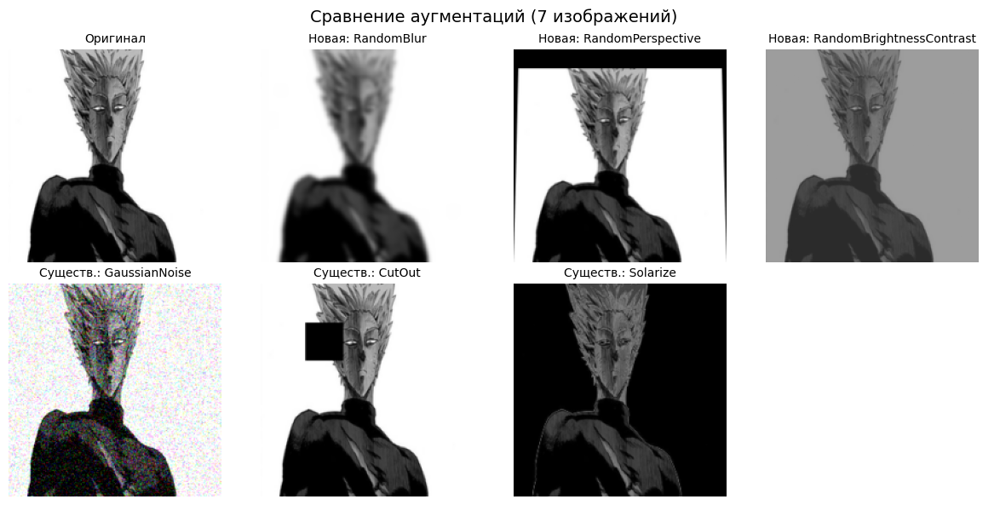


Обработка изображения класса: Генос


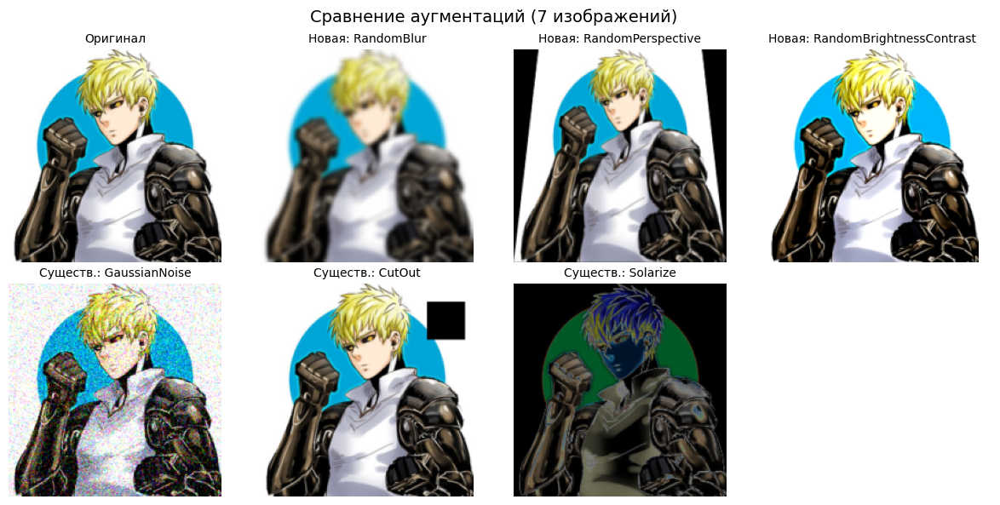


Обработка изображения класса: Сайтама


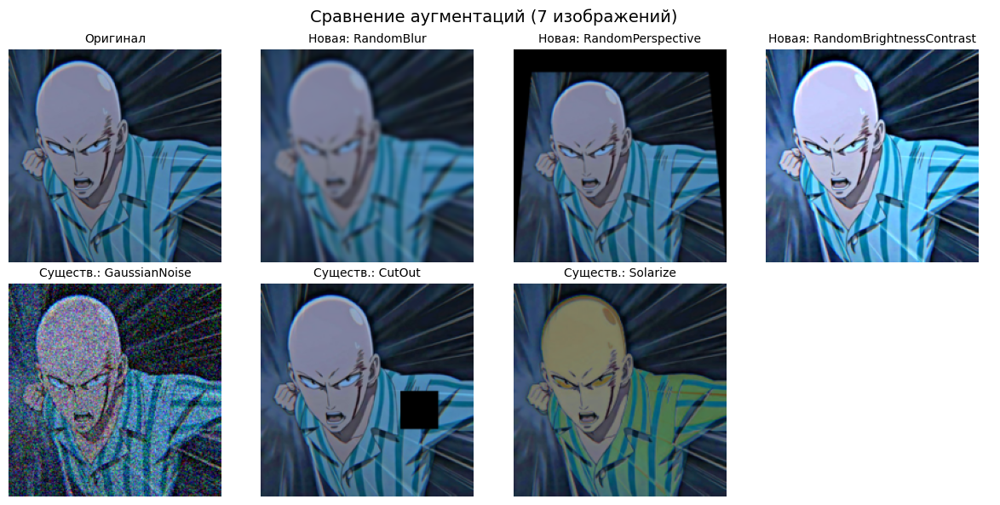


Обработка изображения класса: Соник


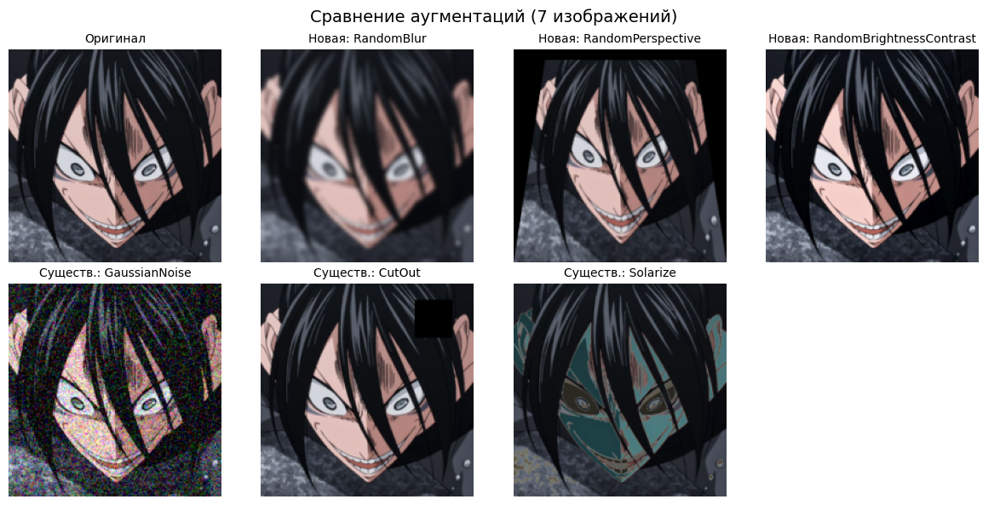


Обработка изображения класса: Татсумаки


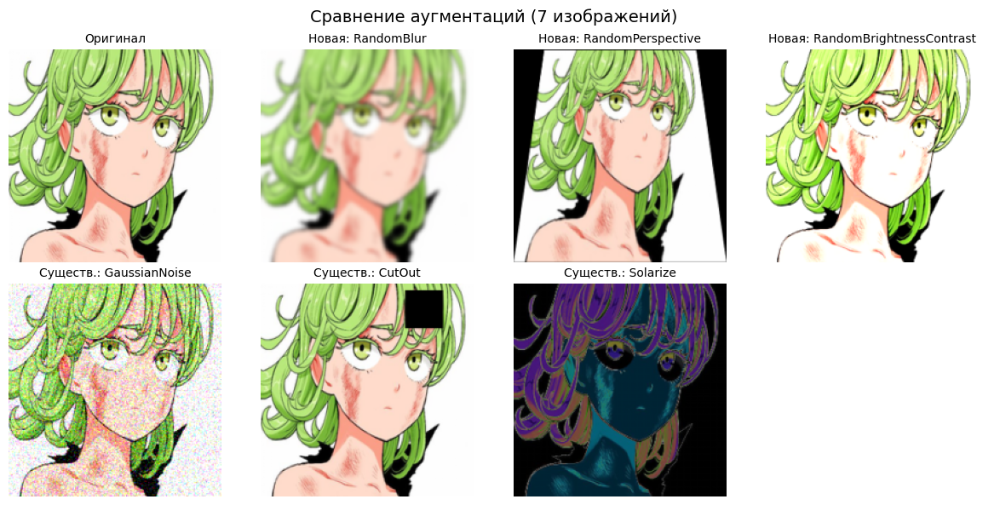


Обработка изображения класса: Фубуки


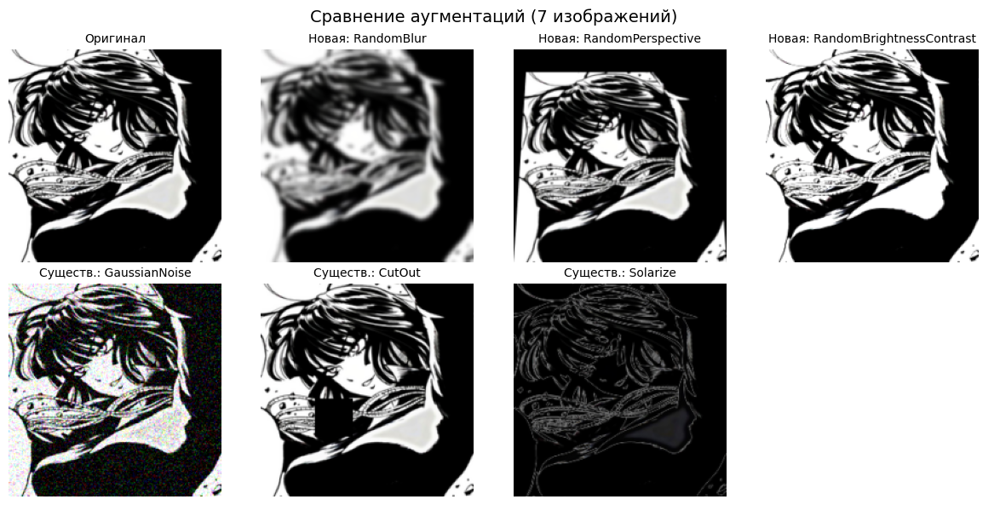

In [4]:
import torchvision.transforms as transforms
from augmentations_basics.datasets import CustomImageDataset
from augmentations_basics.utils import show_multiple_augmentations
from augmentations_basics.extra_augs import *


# Путь к данным
data_path = "data/train"

# Создаем датасет без аугментаций
dataset = CustomImageDataset(
    root_dir=data_path,
    transform=None,
    target_size=(224, 224)
)

# Собираем по одному изображению из 3 разных классов
class_images = {}
for idx in range(len(dataset)):
    img, label = dataset[idx]
    if label not in class_images:
        class_name = dataset.classes[label]
        class_images[label] = (img, class_name)

# Создаем экземпляры новых кастомных аугментаций
new_augmentations = {
    "RandomBlur": RandomBlur(p=1.0, kernel_size=11),
    "RandomPerspective": RandomPerspective(p=1.0, distortion_scale=0.3),
    "RandomBrightnessContrast": RandomBrightnessContrast(
        p=1.0, 
        brightness_range=(0.4, 1.6),
        contrast_range=(0.4, 1.6)
    )
}

# Выбираем существующие аугментации для сравнения
existing_augmentations = {
    "GaussianNoise": AddGaussianNoise(mean=0., std=0.2),
    "CutOut": CutOut(p=1.0, size=(40, 40)),
    "Solarize": Solarize(threshold=128)
}

# Для каждого изображения применяем и сравниваем аугментации
for label, (img, class_name) in class_images.items():
    print(f"\nОбработка изображения класса: {class_name}")
    
    # Конвертируем в тензор
    to_tensor = transforms.ToTensor()
    img_tensor = to_tensor(img)
    
    # Применяем новые аугментации
    new_augmented_imgs = []
    new_titles = []
    for aug_name, augmentation in new_augmentations.items():
        augmented_img = augmentation(img_tensor.clone())
        new_augmented_imgs.append(augmented_img)
        new_titles.append(f"Новая: {aug_name}")
    
    # Применяем существующие аугментации
    existing_augmented_imgs = []
    existing_titles = []
    for aug_name, augmentation in existing_augmentations.items():
        augmented_img = augmentation(img_tensor.clone())
        existing_augmented_imgs.append(augmented_img)
        existing_titles.append(f"Существ.: {aug_name}")
    
    # Собираем все результаты для сравнения
    all_imgs = new_augmented_imgs + existing_augmented_imgs
    all_titles = new_titles + existing_titles
    
    # Визуализируем сравнение с ограничением 4 изображения в строке
    show_multiple_augmentations(
        img_tensor,
        all_imgs,
        all_titles,
        max_per_row=4
    )

## Задание 3: Анализ датасета (10 баллов)

1. Подсчитайте количество изображений в каждом классе.
2. Найдите минимальный, максимальный и средний размеры изображений.
3. Визуализируйте распределение размеров и гистограмму по классам.


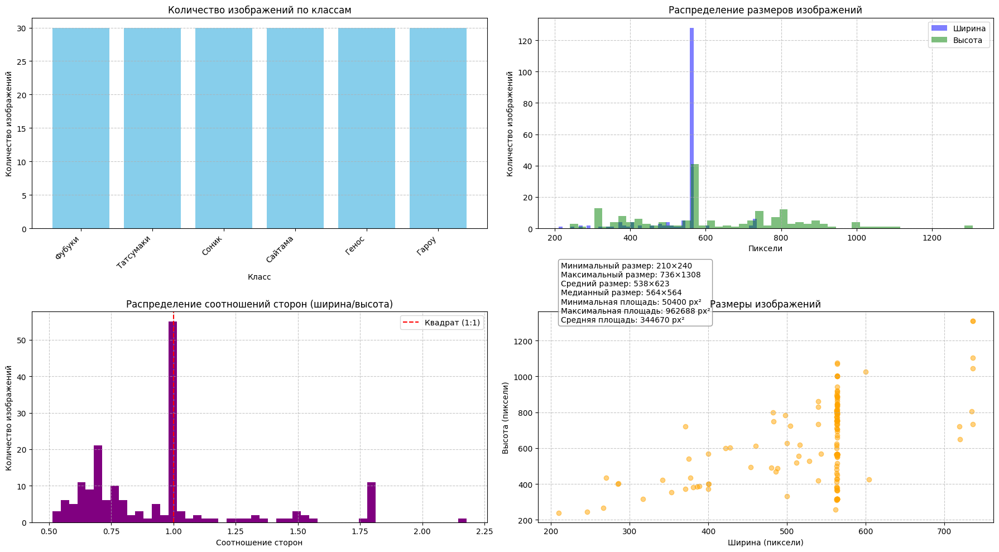


===== Статистика датасета =====
Всего классов: 6
Всего изображений: 180

Размеры изображений:
  Ширина: min=210, max=736, mean=538.9, median=564.0
  Высота: min=240, max=1308, mean=623.6, median=564.0
  Площадь: min=50400, max=962688, mean=344670.9, median=318096.0

Количество изображений по классам:
  Гароу: 30 изображений
  Генос: 30 изображений
  Сайтама: 30 изображений
  Соник: 30 изображений
  Татсумаки: 30 изображений
  Фубуки: 30 изображений

Анализ сохранен в dataset_analysis.png


In [8]:
from collections import defaultdict
import os
import matplotlib.pyplot as plt

# Путь к данным
data_path = "data/train"  # Укажите ваш путь к данным

# 1. Подсчет изображений по классам
class_counts = defaultdict(int)
all_sizes = []  # Для хранения размеров всех изображений
class_sizes = defaultdict(list)  # Размеры изображений по классам

# Проходим по всем классам и изображениям
for class_name in os.listdir(data_path):
    class_dir = os.path.join(data_path, class_name)
    
    if not os.path.isdir(class_dir):
        continue
    
    # Для каждого изображения в классе
    for img_name in os.listdir(class_dir):
        if img_name.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
            img_path = os.path.join(class_dir, img_name)
            
            # Открываем изображение и получаем размер
            try:
                with Image.open(img_path) as img:
                    width, height = img.size
                    size = (width, height)
                    
                    # Сохраняем размеры
                    all_sizes.append(size)
                    class_sizes[class_name].append(size)
                    class_counts[class_name] += 1
            except Exception as e:
                print(f"Ошибка при обработке {img_path}: {e}")

# 2. Расчет статистики размеров
# Извлекаем ширину и высоту
widths = [size[0] for size in all_sizes]
heights = [size[1] for size in all_sizes]
areas = [size[0] * size[1] for size in all_sizes]

# Основная статистика
size_stats = {
    "width": {
        "min": min(widths),
        "max": max(widths),
        "mean": np.mean(widths),
        "median": np.median(widths)
    },
    "height": {
        "min": min(heights),
        "max": max(heights),
        "mean": np.mean(heights),
        "median": np.median(heights)
    },
    "area": {
        "min": min(areas),
        "max": max(areas),
        "mean": np.mean(areas),
        "median": np.median(areas)
    }
}

# 3. Визуализация

# Создаем фигуру с несколькими графиками
plt.figure(figsize=(18, 10))

# График 1: Распределение по классам
plt.subplot(2, 2, 1)
classes = list(class_counts.keys())
counts = list(class_counts.values())

# Сортируем классы по количеству изображений
sorted_classes = [x for _, x in sorted(zip(counts, classes), reverse=True)]
sorted_counts = sorted(counts, reverse=True)

plt.bar(sorted_classes, sorted_counts, color='skyblue')
plt.title('Количество изображений по классам')
plt.xlabel('Класс')
plt.ylabel('Количество изображений')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# График 2: Распределение ширины и высоты
plt.subplot(2, 2, 2)
plt.hist(widths, bins=50, alpha=0.5, label='Ширина', color='blue')
plt.hist(heights, bins=50, alpha=0.5, label='Высота', color='green')
plt.title('Распределение размеров изображений')
plt.xlabel('Пиксели')
plt.ylabel('Количество изображений')
plt.legend()
plt.grid(linestyle='--', alpha=0.7)

# График 3: Соотношение сторон
plt.subplot(2, 2, 3)
aspect_ratios = [w/h for w, h in all_sizes]
plt.hist(aspect_ratios, bins=50, color='purple')
plt.title('Распределение соотношений сторон (ширина/высота)')
plt.xlabel('Соотношение сторон')
plt.ylabel('Количество изображений')
plt.axvline(1.0, color='red', linestyle='--', label='Квадрат (1:1)')
plt.legend()
plt.grid(linestyle='--', alpha=0.7)

# График 4: Размеры в 2D пространстве
plt.subplot(2, 2, 4)
plt.scatter(widths, heights, alpha=0.5, color='orange')
plt.title('Размеры изображений')
plt.xlabel('Ширина (пиксели)')
plt.ylabel('Высота (пиксели)')
plt.grid(linestyle='--', alpha=0.7)

# Добавляем статистику в качестве аннотации
stats_text = (
    f"Минимальный размер: {size_stats['width']['min']}×{size_stats['height']['min']}\n"
    f"Максимальный размер: {size_stats['width']['max']}×{size_stats['height']['max']}\n"
    f"Средний размер: {int(size_stats['width']['mean'])}×{int(size_stats['height']['mean'])}\n"
    f"Медианный размер: {int(size_stats['width']['median'])}×{int(size_stats['height']['median'])}\n"
    f"Минимальная площадь: {size_stats['area']['min']} px²\n"
    f"Максимальная площадь: {size_stats['area']['max']} px²\n"
    f"Средняя площадь: {int(size_stats['area']['mean'])} px²"
)
plt.annotate(
    stats_text,
    xy=(0.05, 0.95),
    xycoords='axes fraction',
    fontsize=10,
    bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", alpha=0.8)
)

plt.tight_layout()
plt.savefig('dataset_analysis.png', dpi=150)
plt.show()

# Выводим статистику в консоль
print("\n===== Статистика датасета =====")
print(f"Всего классов: {len(class_counts)}")
print(f"Всего изображений: {len(all_sizes)}")
print(f"\nРазмеры изображений:")
print(f"  Ширина: min={size_stats['width']['min']}, max={size_stats['width']['max']}, "
      f"mean={size_stats['width']['mean']:.1f}, median={size_stats['width']['median']}")
print(f"  Высота: min={size_stats['height']['min']}, max={size_stats['height']['max']}, "
      f"mean={size_stats['height']['mean']:.1f}, median={size_stats['height']['median']}")
print(f"  Площадь: min={size_stats['area']['min']}, max={size_stats['area']['max']}, "
      f"mean={size_stats['area']['mean']:.1f}, median={size_stats['area']['median']}")

print("\nКоличество изображений по классам:")
for class_name, count in sorted(class_counts.items(), key=lambda x: x[1], reverse=True):
    print(f"  {class_name}: {count} изображений")

print("\nАнализ сохранен в dataset_analysis.png")

## Задание 4: Pipeline аугментаций (20 баллов)

1. Реализуйте класс AugmentationPipeline с методами:
   - add_augmentation(name, aug)
   - remove_augmentation(name)
   - apply(image)
   - get_augmentations()
2. Создайте несколько конфигураций (light, medium, heavy).
3. Примените каждую конфигурацию к train и сохраните результаты.